In [ ]:
!pip uninstall tensorflow -y
!pip install  tensorflow==2.1.0

Uninstalling tensorflow-2.4.1:
  Successfully uninstalled tensorflow-2.4.1
     |████████████████████████████████| 421.8MB 33kB/s 
     |████████████████████████████████| 51kB 8.6MB/s 
     |████████████████████████████████| 450kB 47.3MB/s 
     |████████████████████████████████| 3.9MB 50.8MB/s 
  Created wheel for gast: filename=gast-0.2.2-cp36-none-any.whl size=7540 sha256=dbd7a1fa71857c86fdc27b55383215bd0afedd00f98cc4b993707a26bbf81a18
  Stored in directory: /root/.cache/pip/wheels/5c/2e/7e/a1d4d4fcebe6c381f378ce7743a3ced3699feb89bcfbdadadd
Successfully built gast
ERROR: tensorflow-probability 0.12.1 has requirement gast>=0.3.2, but you'll have gast 0.2.2 which is incompatible.
  Found existing installation: gast 0.3.3
    Uninstalling gast-0.3.3:
      Successfully uninstalled gast-0.3.3
  Found existing installation: tensorflow-estimator 2.4.0
    Uninstalling tensorflow-estimator-2.4.0:
      Successfully uninstalled tensorflow-estimator-2.4.0
  Found existing installation: tenso

In [ ]:
# Python ≥3.5 is required
import sys
assert sys.version_info >= (3, 5)

# Scikit-Learn ≥0.20 is required
import sklearn
assert sklearn.__version__ >= "0.20"

try:
    # %tensorflow_version only exists in Colab.
    %tensorflow_version 2.x
except Exception:
    pass

# TensorFlow ≥2.0 is required
import tensorflow as tf
from tensorflow import keras
assert tf.__version__ >= "2"
print(tf.__version__)

# Common imports
import numpy as np
import os

# to make this notebook's output stable across runs
np.random.seed(42) # answer to universe and everything  

# To plot pretty figures
%matplotlib inline
import matplotlib as mpl
import matplotlib.pyplot as plt
mpl.rc('axes', labelsize=14)
mpl.rc('xtick', labelsize=12)
mpl.rc('ytick', labelsize=12)

import pathlib 
import sklearn.metrics
import itertools
from datetime import datetime
import io
%load_ext tensorboard
%tensorboard --logdir logs


2.1.0


<IPython.core.display.Javascript object>

In [ ]:
# Check if Colab is allocating GPU
gpu_info = !nvidia-smi
gpu_info = '\n'.join(gpu_info)
if gpu_info.find('failed') >= 0:
  print('Select the Runtime → "Change runtime type" menu to enable a GPU accelerator, ')
  print('and then re-execute this cell.')
else:
  print(gpu_info)

Sun Jan 31 10:39:12 2021       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.32.03    Driver Version: 418.67       CUDA Version: 10.1     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   36C    P8     9W /  70W |      0MiB / 15079MiB |      0%      Default |
|                               |                      |                 ERR! |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Double check
device_name = tf.test.gpu_device_name()
if device_name != '/device:GPU:0':
  raise SystemError('GPU device not found')
print('Found GPU at: {}'.format(device_name))

Found GPU at: /device:GPU:0


In [ ]:
#Add Image Folders

data_folder_train = "/content/drive/My Drive/..."
data_folder_test = "/content/drive/My Drive/..."  
data_folder_val = "/content/drive/My Drive/..."  #image directory

data_folder_test2 = "/content/drive/My Drive/..."

data_dir_train = pathlib.Path(data_folder_train)
data_dir_test = pathlib.Path(data_folder_test)
data_dir_val = pathlib.Path(data_folder_val)

data_dir_test2 = pathlib.Path(data_folder_test2)


In [ ]:
image_count_train = len(list(data_dir_train.glob('*/*.jpg')))    #number images in all directories
image_count_test = len(list(data_dir_test.glob('*/*.jpg'))) 
image_count_val = len(list(data_dir_val.glob('*/*.jpg'))) 

image_count_test2 = len(list(data_dir_test2.glob('*/*.jpg'))) 

print("Train count: ",image_count_train)
print("Test count: ",image_count_test)
print("Val count: ",image_count_val)

dataset_size = image_count_train
batch_size_defined = 32

steps_val_min = np.floor(image_count_val/batch_size_defined)   # to not repear info
steps_val_max = np.ceil(image_count_val / batch_size_defined) # to capture all info

steps_test_min = np.floor(image_count_test/batch_size_defined)   # to not repear info
steps_test_max = np.ceil(image_count_test / batch_size_defined) # to capture all info

steps_train_min = np.floor(image_count_train/batch_size_defined)   # to not repear info
steps_train_max = np.ceil(image_count_train / batch_size_defined) # to capture all info


steps_test2_min = np.floor(image_count_test2/batch_size_defined)   # to not repear info
steps_test2_max = np.ceil(image_count_test2 / batch_size_defined) # to capture all info

print("Val Steps - MIN/MAX", steps_val_min,steps_val_max)
print("Test Steps - MIN/MAX", steps_test_min,steps_test_max)
print("Train Steps - MIN/MAX", steps_train_min,steps_train_max)

Train count:  15253
Test count:  3305
Val count:  3248
Val Steps - MIN/MAX 101.0 102.0
Test Steps - MIN/MAX 103.0 104.0
Train Steps - MIN/MAX 476.0 477.0


In [ ]:
def plot_image(image):
    plt.imshow(image, cmap="gray", interpolation="nearest")
    plt.axis("off")

def plot_color_image(image):
    plt.imshow(image, interpolation="nearest")
    plt.axis("off")


def plot_confusion_matrix(cm, class_names):
  """
  Returns a matplotlib figure containing the plotted confusion matrix.

  Args:
    cm (array, shape = [n, n]): a confusion matrix of integer classes
    class_names (array, shape = [n]): String names of the integer classes
  """
  figure = plt.figure(figsize=(30, 30),dpi = 400)
  plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
  plt.title("Confusion matrix")
  plt.colorbar()
  tick_marks = np.arange(len(class_names))
  plt.xticks(tick_marks, class_names, rotation =90)
  plt.yticks(tick_marks, class_names)

  # Normalize the confusion matrix.
  cm = np.around(cm.astype('float') / cm.sum(axis=1)[:, np.newaxis], decimals=2)

  # Use white text if squares are dark; otherwise black.
  threshold = cm.max() / 2.
  for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
    color = "white" if cm[i, j] > threshold else "black"
    plt.text(j, i, cm[i, j], horizontalalignment="center", color=color)

  plt.tight_layout()
  plt.ylabel('True label')
  plt.xlabel('Predicted label')
  return figure

def plot_to_image(figure):
  """Converts the matplotlib plot specified by 'figure' to a PNG image and
  returns it. The supplied figure is closed and inaccessible after this call."""
  # Save the plot to a PNG in memory.
  buf = io.BytesIO()
  plt.savefig(buf, format='png')
  # Closing the figure prevents it from being displayed directly inside
  # the notebook.
  plt.close(figure)
  buf.seek(0)
  # Convert PNG buffer to TF image
  image = tf.image.decode_png(buf.getvalue(), channels=4)
  # Add the batch dimension
  image = tf.expand_dims(image, 0)
  return image


In [ ]:
#Classes in Model
class_names = ["ATHLEAN-X",
"AsapSCIENCE",
"AzzyLand",
"BRIGHT SIDE",
"Brave Wilderness",
"Brent Rivera",
"CaseyNeistat",
"Chad Wild Clay",
"Chloe Ting",
"CollegeHumor",
"Collins Key",
"CrashCourse",
"DanTDM",
"Dang Matt Smith",
"David Dobrik",
"Dude Perfect",
"FGTeeV",
"FaZe Rug",
"FitnessBlender",
"Good Mythical Morning",
"Guava Juice",
"Infinite",
"Jake Paul",
"James Charles",
"Jelly",
"JennaMarbles",
"LTT",
"LazarBeam",
"Lilly Singh",
"Liza Koshy",
"Logan Paul",
"Lucas and Marcus",
"Markiplier",
"Marques Brownlee",
"Matthew Santoro",
"Miranda Sings",
"MrBeast",
"MyLifeAsEva",
"Ninja",
"Pencilmation",
"PewDiePie",
"Preston",
"Reaction Time",
"Rosanna Pansino",
"SSSniperWolf",
"SmarterEveryDay",
"Smosh",
"Tasty",
"The Royalty Family",
"Troom Troom",
"Unbox Therapy",
"Zach Choi ASMR",
"jeffreestar",
"nigahiga"]
n_classes = len(class_names)
print(class_names)
print("Number Classes: ",n_classes)

['ATHLEAN-X', 'AsapSCIENCE', 'AzzyLand', 'BRIGHT SIDE', 'Brave Wilderness', 'Brent Rivera', 'CaseyNeistat', 'Chad Wild Clay', 'Chloe Ting', 'CollegeHumor', 'Collins Key', 'CrashCourse', 'DanTDM', 'Dang Matt Smith', 'David Dobrik', 'Dude Perfect', 'FGTeeV', 'FaZe Rug', 'FitnessBlender', 'Good Mythical Morning', 'Guava Juice', 'Infinite', 'Jake Paul', 'James Charles', 'Jelly', 'JennaMarbles', 'LTT', 'LazarBeam', 'Lilly Singh', 'Liza Koshy', 'Logan Paul', 'Lucas and Marcus', 'Markiplier', 'Marques Brownlee', 'Matthew Santoro', 'Miranda Sings', 'MrBeast', 'MyLifeAsEva', 'Ninja', 'Pencilmation', 'PewDiePie', 'Preston', 'Reaction Time', 'Rosanna Pansino', 'SSSniperWolf', 'SmarterEveryDay', 'Smosh', 'Tasty', 'The Royalty Family', 'Troom Troom', 'Unbox Therapy', 'Zach Choi ASMR', 'jeffreestar', 'nigahiga']
Number Classes:  54


In [ ]:
# Generatores definition
def train_generator():
    data_gen_args_train = dict(zoom_range=[0.90,1.1],     #[1-zoom_range, 1+zoom_range].
                           brightness_range=[0.8,1.2],
                           horizontal_flip=True  
                                                            
                              )
    
    image_datagen_train = tf.keras.preprocessing.image.ImageDataGenerator(data_gen_args_train)
    

    
    
    
    
    train_gen = image_datagen_train.flow_from_directory(data_folder_train,                      #training folder
                                                              class_mode="categorical",
                                                              target_size=(299, 299),
                                                              color_mode="rgb",
                                                              shuffle=True,
                                                              batch_size=batch_size_defined)
    
    return train_gen
    
    
def val_generator():
    data_gen_args_val_test = dict()
    image_datagen_validate_train = tf.keras.preprocessing.image.ImageDataGenerator(data_gen_args_val_test)   


    
    val_gen = image_datagen_validate_train.flow_from_directory(data_folder_val,
                                                               class_mode="categorical",
                                                               target_size=(299, 299),
                                                               color_mode="rgb",
                                                               shuffle=False,
                                                               batch_size=batch_size_defined)
   
    
    return val_gen


def test_generator():
    data_gen_args_val_test = dict()
    image_datagen_validate_train = tf.keras.preprocessing.image.ImageDataGenerator(data_gen_args_val_test)   


    
    test_gen = image_datagen_validate_train.flow_from_directory(data_folder_test,
                                                               class_mode="categorical",
                                                               target_size=(299, 299),
                                                               color_mode="rgb",
                                                               shuffle=True,
                                                               batch_size=batch_size_defined)
    
    
    
    return test_gen

        



    
    






def test2_generator():
    data_gen_args_val_test = dict()
    image_datagen_validate_train = tf.keras.preprocessing.image.ImageDataGenerator(data_gen_args_val_test)   


    
    test_gen = image_datagen_validate_train.flow_from_directory(data_folder_test2,  #test2
                                                               class_mode="categorical",
                                                               target_size=(299, 299),
                                                               color_mode="rgb",
                                                               shuffle=True,
                                                               batch_size=batch_size_defined)
    
    
    
    return test_gen


def preprocess_xception(image, label):
    """Pre processing"""
    resized_image = tf.image.resize(image,[299,299])  #resize  already done
     #resized_image = image
    final_image = keras.applications.xception.preprocess_input(resized_image)  #processing step for model
    #final_image = keras.applications.xception.preprocess_input(resized_image * 255)  #processing step for model
    return final_image , label   #final_image


# Set Datasets from generators
train_dataset = tf.data.Dataset.from_generator(train_generator,output_types=(tf.float32, tf.float32),output_shapes=([None,299,299,3], [None,n_classes]))
val_dataset = tf.data.Dataset.from_generator(val_generator,output_types=(tf.float32, tf.float32),output_shapes=([None,299,299,3], [None,n_classes]))                                       
test_dataset = tf.data.Dataset.from_generator(test_generator,output_types=(tf.float32, tf.float32),output_shapes=([None,299,299,3], [None,n_classes]))
test2_dataset = tf.data.Dataset.from_generator(test2_generator,output_types=(tf.float32, tf.float32),output_shapes=([None,299,299,3], [None,n_classes]))
     
    
print(train_dataset)
print(val_dataset)
print(test_dataset)

#Map based on generators
train_set = train_dataset.map(preprocess_xception)
valid_set = val_dataset.map(preprocess_xception)
test_set = test_dataset.map(preprocess_xception)
test2_set = test2_dataset.map(preprocess_xception)

print(train_set)
print(valid_set)
print(test_set)
print(test2_set)

<FlatMapDataset shapes: ((None, 299, 299, 3), (None, 54)), types: (tf.float32, tf.float32)>
<FlatMapDataset shapes: ((None, 299, 299, 3), (None, 54)), types: (tf.float32, tf.float32)>
<FlatMapDataset shapes: ((None, 299, 299, 3), (None, 54)), types: (tf.float32, tf.float32)>


In [ ]:
#Extract Images to be plotted in TensorBoard
# Avoid this if you can
batch_train = next(train_set.take(1).as_numpy_iterator())
images_tb = np.reshape(batch_train[0], (32, 299, 299, 3))

#Extract Valid Labels from generator // For Confusion Matrix
valid_set_labels = valid_set.enumerate()
ans = np.array([]) 
for i, element in (valid_set_labels.as_numpy_iterator()):
  ans = np.concatenate((ans,np.argmax(element[1],axis=1)),axis =0)
  if i == np.floor(steps_val_min):     #image_count_val/32
    break
valid_set_labels = ans

Found 15253 images belonging to 54 classes.


/usr/local/lib/python3.6/dist-packages/keras_preprocessing/image/image_data_generator.py:720: UserWarning: This ImageDataGenerator specifies `featurewise_center`, but it hasn't been fit on any training data. Fit it first by calling `.fit(numpy_data)`.
  warnings.warn('This ImageDataGenerator specifies '


Found 3248 images belonging to 54 classes.


In [ ]:
### Plot Train Images in TensorBoard

# Sets up a timestamped log directory.
logdir = "logs/train_data/" + datetime.now().strftime("%Y%m%d-%H%M")
# Creates a file writer for the log directory.
file_writer = tf.summary.create_file_writer(logdir)

# Using the file writer, log the reshaped image.
with file_writer.as_default():
  #images = train_set.take(1) 
  tf.summary.image("32 training data examples", images_tb, max_outputs=32, step=0)


In [ ]:
#Define NN architecture & load pretrained weights
base_model = keras.applications.xception.Xception(weights="imagenet",include_top=False)

avg = keras.layers.GlobalAveragePooling2D()(base_model.output)

output = keras.layers.Dense(n_classes, activation = "softmax")(avg)  
model = keras.models.Model(inputs = base_model.input, outputs = output)


83689472/83683744 [==============================] - 3s 0us/step


In [ ]:
# Freeze weights of pre trained layers
for layer in base_model.layers:
    layer.trainable = False


In [ ]:
#compile
optimizer = keras.optimizers.SGD(lr=0.01, momentum = 0.9) 
model.compile(loss="categorical_crossentropy", optimizer=optimizer,
              metrics=[tf.keras.metrics.CategoricalAccuracy(),tf.keras.metrics.TopKCategoricalAccuracy(k=3)])


In [ ]:
## Warm up GPU

import timeit
def gpu():
  with tf.device('/device:GPU:0'):
    random_image_gpu = tf.random.normal((100, 100, 100, 3))
    net_gpu = tf.keras.layers.Conv2D(32, 7)(random_image_gpu)
    return tf.math.reduce_sum(net_gpu)

gpu()

gpu_time = timeit.timeit('gpu()', number=10, setup="from __main__ import gpu")
print(gpu_time)


0.10979961499992896


In [ ]:
#Fit top layer
with tf.device('/device:GPU:0'):
  history = model.fit(train_set,
                      steps_per_epoch=int(steps_train_max),   # 0.75 * dataset_size / 32
                      validation_data=valid_set,
                      validation_steps=int(steps_val_max),   #0.15 * dataset_size / 32
                      epochs = 5)

Train for 477 steps, validate for 102 steps
Epoch 1/5
Found 15253 images belonging to 54 classes.


/usr/local/lib/python3.6/dist-packages/keras_preprocessing/image/image_data_generator.py:720: UserWarning: This ImageDataGenerator specifies `featurewise_center`, but it hasn't been fit on any training data. Fit it first by calling `.fit(numpy_data)`.
  warnings.warn('This ImageDataGenerator specifies '


477/477 [==============================] - 6100s 13s/step - loss: 3.0070 - categorical_accuracy: 0.3163 - top_k_categorical_accuracy: 0.4821 - val_loss: 2.6482 - val_categorical_accuracy: 0.3550 - val_top_k_categorical_accuracy: 0.5336
Epoch 2/5
477/477 [==============================] - 165s 345ms/step - loss: 2.1570 - categorical_accuracy: 0.4930 - top_k_categorical_accuracy: 0.6795 - val_loss: 2.3955 - val_categorical_accuracy: 0.3975 - val_top_k_categorical_accuracy: 0.6007
Epoch 3/5
477/477 [==============================] - 165s 346ms/step - loss: 1.8771 - categorical_accuracy: 0.5468 - top_k_categorical_accuracy: 0.7293 - val_loss: 2.3477 - val_categorical_accuracy: 0.4027 - val_top_k_categorical_accuracy: 0.6010
Epoch 4/5
477/477 [==============================] - 165s 345ms/step - loss: 1.7205 - categorical_accuracy: 0.5773 - top_k_categorical_accuracy: 0.7564 - val_loss: 2.2700 - val_categorical_accuracy: 0.4258 - val_top_k_categorical_accuracy: 0.6201
Epoch 5/5
477/477 [====

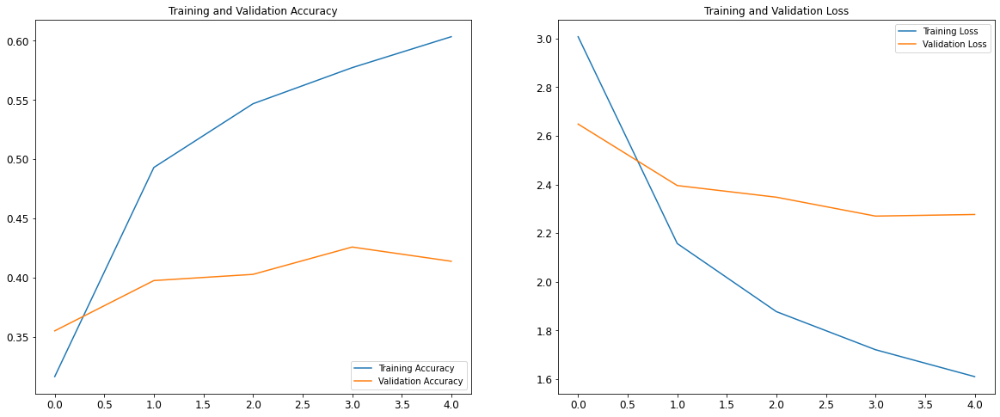

In [ ]:
#Check Graphs to avoid tensorboard
epochs=5

acc = history.history['categorical_accuracy']
val_acc = history.history['val_categorical_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']


epochs_range = range(epochs)

plt.figure(figsize=(20, 8))
plt.subplot(1, 2, 1)

plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

In [ ]:
def log_confusion_matrix(epoch, logs):
  # Use the model to predict the values from the validation dataset.
  test_pred_raw = model.predict(valid_set,steps=steps_val_max)    #on validation set    validset/batchsize  20
  test_pred = np.argmax(test_pred_raw, axis=1)

  # Calculate the confusion matrix.
  cm = sklearn.metrics.confusion_matrix(y_true = valid_set_labels, y_pred = test_pred)
  # Log the confusion matrix as an image summary.
  figure = plot_confusion_matrix(cm, class_names=class_names)
  cm_image = plot_to_image(figure)

  # Log the confusion matrix as an image summary.
  with file_writer_cm.as_default():
    tf.summary.image("Confusion Matrix", cm_image, step=epoch)

# Define the per-epoch callback.
cm_callback = keras.callbacks.LambdaCallback(on_epoch_end = log_confusion_matrix)

In [ ]:
#Plotting and saving Learning Rate Scheduler callback
logdir = "logs/" + datetime.now().strftime("%Y%m%d-%H%M")
file_writer = tf.summary.create_file_writer(logdir + "/metrics")
file_writer.set_as_default()
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir = logdir)

file_writer_cm = tf.summary.create_file_writer(logdir + '/cm')
 
def scheduler_rate(epoch):    # after 7 epoch decrease
    if epoch < int(7):
        learning_rate =  0.01
    else:

        learning_rate =  0.01 * tf.math.exp(0.1 * (7 - epoch))
        
    tf.summary.scalar('learning rate', data=learning_rate, step=epoch)
    return learning_rate



learning_rate = tf.keras.callbacks.LearningRateScheduler(scheduler_rate,verbose=1)     #scheduler_rate
early_stopping = keras.callbacks.EarlyStopping(patience = 5,restore_best_weights = True,verbose=1)



# Saving weights from all intermidiate models, callback
outputFolder = logdir + '/checkpoints'
if not os.path.exists(outputFolder):
    os.makedirs(outputFolder)
filepath_check = outputFolder + "/model-{epoch:02d}-{val_categorical_accuracy:.2f}.hdf5"    # was val_accuracy

model_checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(filepath=filepath_check,
                                                               save_weights_only=True,
                                                               monitor='val_categorical_accuracy',
                                                               mode='auto',
                                                               save_best_only=False,
                                                               verbose=1)

#Unfreze model
for layer in base_model.layers:
    layer.trainable = True


optimizer = keras.optimizers.SGD(lr=0.001, momentum=0.9)

model.compile(loss="categorical_crossentropy", optimizer=optimizer,
              metrics=[tf.keras.metrics.CategoricalAccuracy(),tf.keras.metrics.TopKCategoricalAccuracy(k=3)]
              )



history = model.fit_generator(train_set,
                      steps_per_epoch=int(steps_train_max),   
                      validation_data=valid_set,
                      validation_steps=int(steps_val_max),   
                      epochs = 10,
                      callbacks=[tensorboard_callback , early_stopping , learning_rate , cm_callback,model_checkpoint_callback ])

Instructions for updating:
Please use Model.fit, which supports generators.
Train for 477 steps, validate for 102 steps

Epoch 00001: LearningRateScheduler reducing learning rate to 0.01.
Epoch 1/10
Found 15253 images belonging to 54 classes.


/usr/local/lib/python3.6/dist-packages/keras_preprocessing/image/image_data_generator.py:720: UserWarning: This ImageDataGenerator specifies `featurewise_center`, but it hasn't been fit on any training data. Fit it first by calling `.fit(numpy_data)`.
  warnings.warn('This ImageDataGenerator specifies '


476/477 [============================>.] - ETA: 1s - loss: 0.9144 - categorical_accuracy: 0.7565 - top_k_categorical_accuracy: 0.8792Found 3248 images belonging to 54 classes.
Found 3248 images belonging to 54 classes.

Epoch 00001: saving model to logs/20210130-1401/checkpoints/model-01-0.78.hdf5
477/477 [==============================] - 685s 1s/step - loss: 0.9138 - categorical_accuracy: 0.7566 - top_k_categorical_accuracy: 0.8792 - val_loss: 0.8106 - val_categorical_accuracy: 0.7839 - val_top_k_categorical_accuracy: 0.8919

Epoch 00002: LearningRateScheduler reducing learning rate to 0.01.
Epoch 2/10
476/477 [============================>.] - ETA: 1s - loss: 0.2183 - categorical_accuracy: 0.9479 - top_k_categorical_accuracy: 0.9838Found 3248 images belonging to 54 classes.
Found 3248 images belonging to 54 classes.

Epoch 00002: saving model to logs/20210130-1401/checkpoints/model-02-0.80.hdf5
477/477 [==============================] - 676s 1s/step - loss: 0.2182 - categorical_accu

In [ ]:
loss, acc, k_acc = model.evaluate(test_set,steps = steps_test_max, verbose = 1)    

print("Accuracy: ",np.round( acc * 100,2))
print("Top 3 Accuracy: ",np.round( k_acc * 100,2))
model.save('saved_model_name.h5')   

Found 3305 images belonging to 54 classes.
104/104 [==============================] - 1330s 13s/step - loss: 0.6401 - categorical_accuracy: 0.8375 - top_k_categorical_accuracy: 0.9319
Accuracy:  83.75
Top 3 Accuracy:  93.19


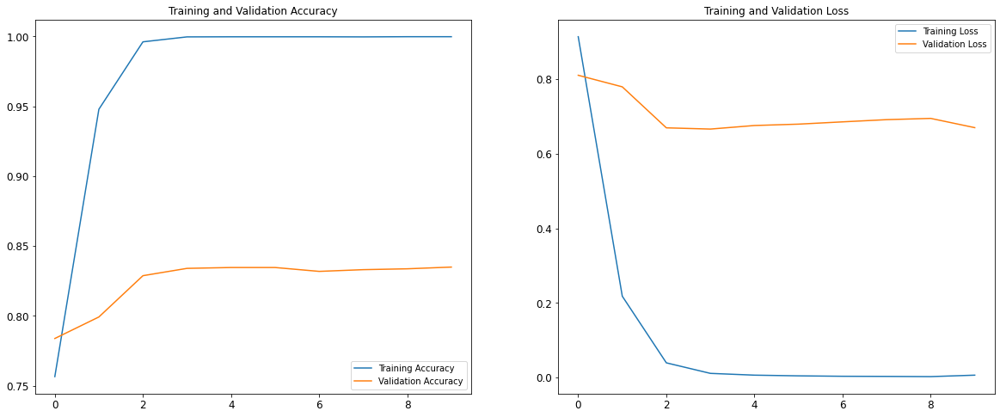

In [ ]:
epochs=10
acc = history.history['categorical_accuracy']
val_acc = history.history['val_categorical_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(epochs)

plt.figure(figsize=(20, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

In [ ]:
valid_pred_raw = model.predict(valid_set,steps=102)    #on validation set    validset/batchsize
valid_pred = np.argmax(valid_pred_raw, axis=1)

  # Calculate the confusion matrix.
cm = sklearn.metrics.confusion_matrix(y_true = valid_set_labels, y_pred = valid_pred)
  # Log the confusion matrix as an image summary.
figure = plot_confusion_matrix(cm, class_names=class_names)
cm_image = plot_to_image(figure)
figure

Found 3248 images belonging to 54 classes.


# GradCam - Understand where CNN is looking

In [ ]:
!pip install tf_explain
model = tf.keras.models.load_model('loadmodel here.h5')


     |████████████████████████████████| 51kB 5.8MB/s 


Found 3372 images belonging to 54 classes.


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


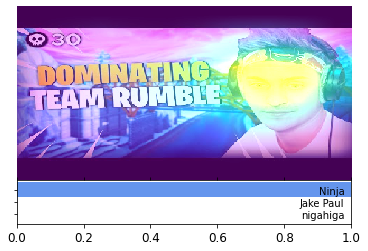

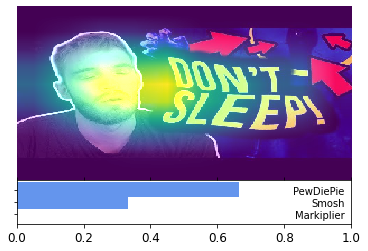

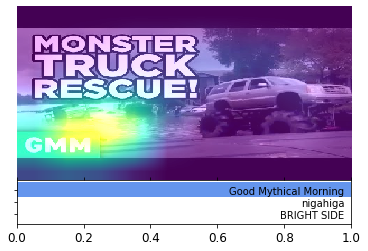

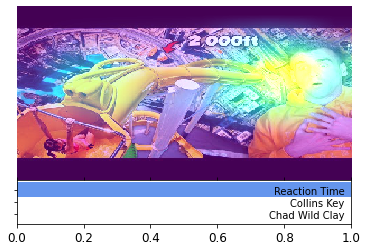

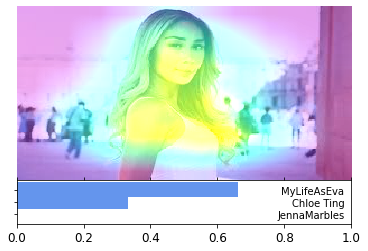

...

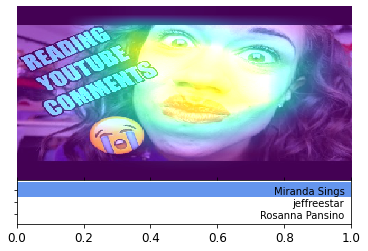

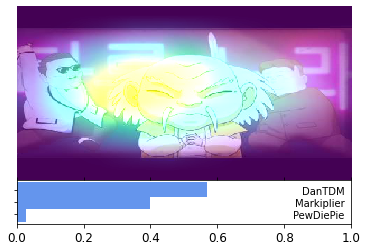

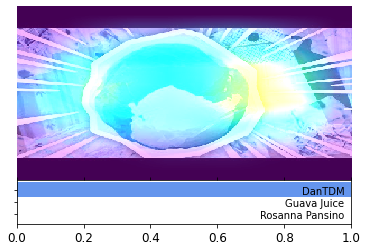

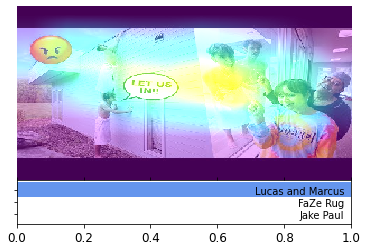

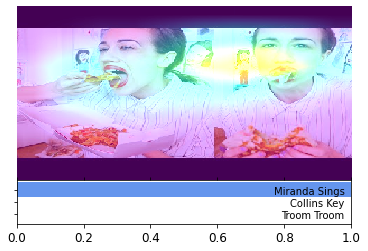

In [ ]:
#Display Class probability and GradCam 
from tf_explain.core.grad_cam import GradCAM
import matplotlib.gridspec as gridspec

def plot_row_item(image_ax, labels_ax, pixels, top_character_names, top_character_probabilities):
    image_ax.imshow(pixels, interpolation='nearest', aspect='auto')
    y_pos = np.arange(len(top_character_names))*0.1
    labels_ax.barh(y_pos, top_character_probabilities, height=0.12, align='center',
            color='cornflowerblue', ecolor='black')
    labels_ax.set_xlim([0,1])
    labels_ax.set_yticks(y_pos)
    labels_ax.set_yticklabels(top_character_names, position=(1,0), size = 10)
    labels_ax.invert_yaxis()
    labels_ax.tick_params(
        axis='both',
        which='both',
        bottom='off',
        top='off',
        labelbottom='off')
    image_ax.axis('off')  

#Construct grid to extract images from
dict_images = []
ind = 0
for y in range(0, 6*299, 299):
    for x in range(0, 6*299, 299):
        dict_images.append((ind,int(y),int(x)))
        ind = ind+1


for X_batch, y_batch in test_set.shuffle(100).take(1):  #test_set2
    y_proba = model.predict(X_batch)
    y_proba_r = np.round(y_proba*100)
    
    

    # Instantiation of the explainer
    explainer = GradCAM()
    out = explainer.explain( (X_batch.numpy(),y_batch.numpy()), model = model, class_index = 0)
    

    num_images = 32
    
    for i in range(num_images):
          
        fig = plt.figure()
        inner = gridspec.GridSpec(2, 1, wspace=0.1, hspace=0, height_ratios=[4, 1])
        image_ax = plt.Subplot(fig, inner[0])
        labels_ax = plt.Subplot(fig, inner[1])
        proba_dict = [(prob, class_index, class_names[class_index]) for class_index, prob, in enumerate(y_proba[i])]
        decode_prediction_top = sorted(proba_dict, reverse = True, key = lambda class_prob: class_prob[0])[:3]    #Get top 3 most prob classes
        probability_top, index_top, class_name_top = zip(*decode_prediction_top)

        
        out_crop = tf.image.crop_to_bounding_box(image = out, offset_height = dict_images[i][1], offset_width = dict_images[i][2], target_height = 299, target_width = 299)
        
        plot_row_item(image_ax, labels_ax, pixels = out_crop , top_character_names = class_name_top, top_character_probabilities = probability_top)
        fig.add_subplot(image_ax)
        fig.add_subplot(labels_ax)
        
